In [77]:
import time
import glob
from itertools import cycle, islice

import anndata
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from ALLCools.clustering import significant_pc_test, tsne, ConsensusClustering, get_pc_centers
from ALLCools.integration import SeuratIntegration
from ALLCools.plot import *
from seaborn import clustermap

from sklearn.preprocessing import normalize
from wmb import aibs, brain, cemba
import matplotlib as mpl
mpl.style.use("default")
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"] = 42
mpl.rcParams["font.family"] = "sans-serif"
mpl.rcParams["font.sans-serif"] = "Helvetica"




In [2]:
def dump_embedding(adata, name, n_dim=2):
    # put manifold coordinates into adata.obs
    for i in range(n_dim):
        adata.obs[f"{name}_{i}"] = adata.obsm[f"X_{name}"][:, i]
    return adata

In [3]:
# Parameters
group_name = "TH"

In [4]:
t = group_name

In [5]:
adata_merge = anndata.read_h5ad(glob.glob(f'{t}_*_rs1rs2rna.h5ad')[0])
adata_merge

AnnData object with n_obs × n_vars = 182344 × 1
    obs: 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'L1', 'L1_annot', 'L4', 'L4Region', 'L2_annot', 'Train', 'Study', 'Exp', 'Source', 'Target', 'Gender', 'L2', 'L3', 'PlateNormReads', 'count', 'umi_count', 'tsne_0', 'tsne_1', 'leiden'
    uns: 'leiden', 'neighbors'
    obsm: 'X_pca', 'X_tsne', 'u50seurat_tsne'
    obsp: 'connectivities', 'distances'

In [6]:
retro = anndata.read_h5ad(glob.glob(f'{t}_*_retro_new.h5ad')[0])
retro

AnnData object with n_obs × n_vars = 1972 × 5404
    obs: 'well', 'plate', 'i7_barcode_name', 'cell_barcode', 'Projection', 'animal_id', 'animal_age', 'animal_sex', 'date_sort', 'date_cDNA', 'date_lib', 'total_UMI', 'genes_detected', 'is_ODC', 'cluster', 'joint_cluster', 'file_name_barcode', 'file_name_mRNA', 'Study', 'leiden', 'leiden_score', 'tsne_0', 'tsne_1'
    uns: 'log1p'
    obsm: 'X_pca', 'X_pca_corrected', 'cef_pca'

In [7]:
ds = 0.2
coord_base = "tsne"

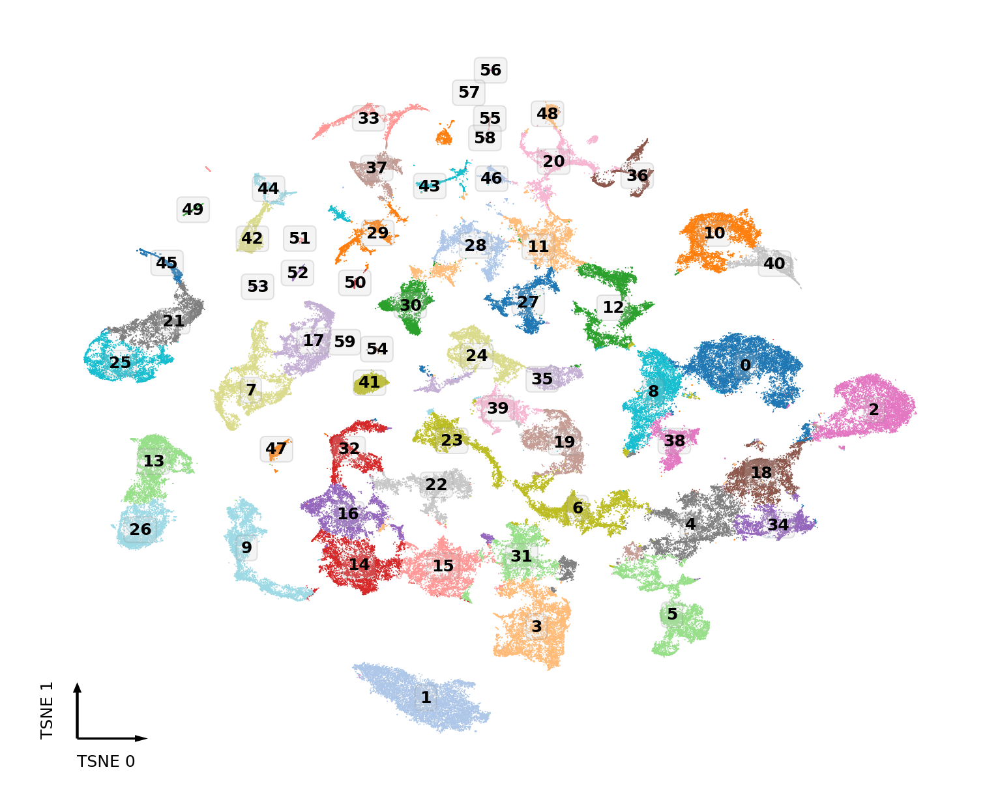

In [9]:
fig, ax = plt.subplots(figsize=(5, 4), dpi=300, constrained_layout=True)
_ = categorical_scatter(
    data=adata_merge.obs,
    ax=ax,
    coord_base=coord_base,
    s=ds,
    hue="leiden",
    text_anno="leiden",
    palette="tab20",
    labelsize=6,
    max_points=None,
    scatter_kws={"rasterized": True},
    show_legend=False,
    outline=None,
    # legend_kws = {'ncol':1, 'fontsize':4}
)


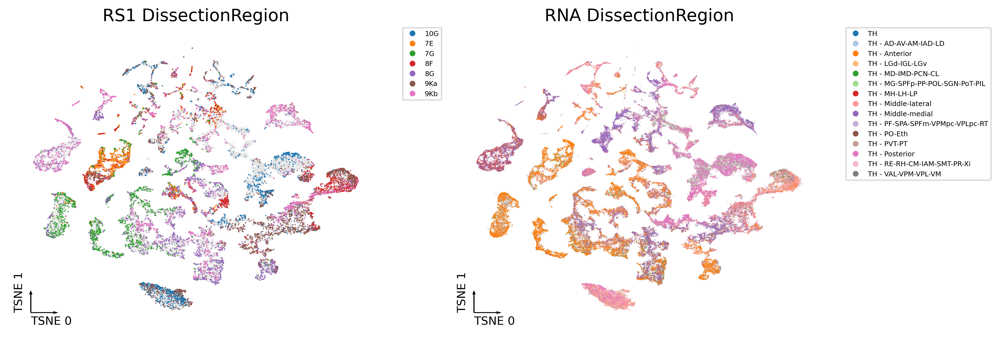

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4), dpi=300, constrained_layout=True)
ax = axes.flatten()

tmp = adata_merge.obs.loc[adata_merge.obs["Study"] == "CEMBA_snmC"]
ax[0].scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    rasterized=True,
)
_ = categorical_scatter(
    data=tmp,
    ax=ax[0],
    coord_base=coord_base,
    s=ds * 5,
    hue="CEMBARegion",
    # text_anno='Study',
    palette="tab10",
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
    show_legend=True,
    legend_kws={"ncol": len(np.unique(tmp['CEMBARegion']))//30+1, "fontsize": 6},
)


tmp = adata_merge.obs.loc[adata_merge.obs["Study"] == "AIBS_10x"]
ax[1].scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    rasterized=True,
)
_ = categorical_scatter(
    data=tmp,
    ax=ax[1],
    coord_base=coord_base,
    s=ds,
    hue="DissectionRegion",
    # text_anno='Study',
    palette="tab20",
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
    show_legend=True,
    legend_kws={"ncol": len(np.unique(tmp['DissectionRegion']))//30+1, "fontsize": 6},
)

for i, xx in enumerate(["RS1 DissectionRegion", "RNA DissectionRegion"]):
    axes.flatten()[i].set_title(xx, fontsize=15)

# plt.savefig(f'cell_{adata_merge.shape[0]}_{t}_AIBS10x_CEMBAsnmC_CEMBAEpiRetro.CEMBARegion_AIBSRegion.pdf', transparent=True)

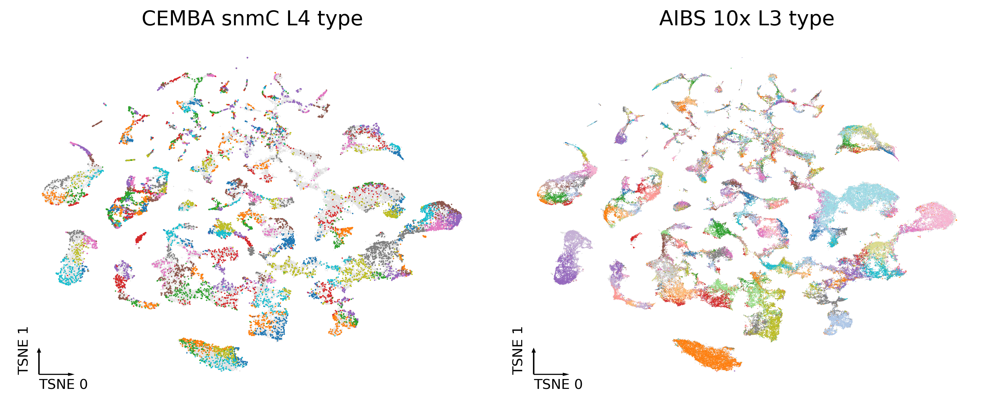

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=300, constrained_layout=True)
ax = axes.flatten()

tmp = adata_merge.obs.loc[adata_merge.obs["Study"] == "CEMBA_snmC"]
ax[0].scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    rasterized=True,
)
_ = categorical_scatter(
    data=tmp,
    ax=ax[0],
    coord_base=coord_base,
    s=ds * 5,
    hue="L4",
    # text_anno='Study',
    palette="tab10",
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
    # show_legend=True,
    # legend_kws={"ncol": len(np.unique(tmp['CEMBARegion']))//30+1, "fontsize": 6},
)


tmp = adata_merge.obs.loc[adata_merge.obs["Study"] == "AIBS_10x"]
ax[1].scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    rasterized=True,
)
_ = categorical_scatter(
    data=tmp,
    ax=ax[1],
    coord_base=coord_base,
    s=ds,
    hue="L3",
    # text_anno='Study',
    palette="tab20",
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
    # show_legend=True,
    # legend_kws={"ncol": len(np.unique(tmp['DissectionRegion']))//30+1, "fontsize": 6},
)

for i, xx in enumerate(["CEMBA snmC L4 type", "AIBS 10x L3 type"]):
    axes.flatten()[i].set_title(xx, fontsize=15)

# plt.savefig(f'cell_{adata_merge.shape[0]}_{t}_AIBS10x_CEMBAsnmC_CEMBAEpiRetro.CEMBARegion_AIBSRegion.pdf', transparent=True)

In [8]:
meta_rs2 = pd.read_csv("/cemba/CEMBA_RS2/cell_48032_RS2_meta_nooutlier.csv.gz", index_col=0, header=0)
meta_rs2 = meta_rs2.loc[meta_rs2['PassTargetFilter']]


In [9]:
adata_merge.obs['Target'] = adata_merge.obs['Target'].astype(str)
adata_merge.obs.loc[~adata_merge.obs.index.isin(meta_rs2.index), 'Target'] = '?'


In [10]:
tarall = [
    "PFC",
    "MOp",
    "SSp",
    "ACA",
    "AI",
    "AUDp",
    "RSP",
    "PTLp",
    "VISp",
    "MOB",
    "ENT",
    "HPF",
    "PIR",
    "AMY",
    "STR",
    "PAL",
    "TH",
    "HY",
    "SC",
    "VTA",
    "P",
    "MY",
    "CBN",
    "CBX",
]
target_list = [xx for xx in tarall if xx in adata_merge.obs.loc[adata_merge.obs.index.isin(meta_rs2.index), "Target"].values]
target_list

['PFC',
 'MOp',
 'SSp',
 'ACA',
 'AI',
 'AUDp',
 'RSP',
 'PTLp',
 'VISp',
 'SC',
 'VTA',
 'P']

In [11]:
rs2_subregion_dict = {
    "MOp": ["3C", "4B"],
    "SSp": ["6B", "7B"],
    "ACA": ["3A", "4A", "5A"],
    "AI": ["3D"],
    "RSP": ["9A", "10A"],
    "AUD": ["9D", "10C"],
    "PTLp": ["9B"],
    "VIS": ["11B", "12B"],
    "ENT": ["10D11D12D13B"],
    "CAa": ["8E9H"],
    "CAp": ["10E11E"],
    "DGa": ["8J9J"],
    "DGp": ["10F11F"],
    "PIRa": ["2D3E4F5G"],
    "PIRp": ["6D7D8D9E"],
    "MOB": ["1C"],
    "AON": ["2E"],
    "PAL": ["4H5H6F7F", "6F7F"],
    "STR": ["4D5E6E"],
    "AMY": ["7H8H9G"],
    "THl": ["7E8F"],
    "THm": ["7G8G"],
    "THp": ["9K10G"],
    "HY": ["6H7J8K9L"],
    "SC": ["11G12F13C"],
    "MRN": ["10H11H12H"],
    "VTA": ["10J11J"],
    "PAG": ["12G13D"],
    "IC": ["14A"],
    "P": ["12J13E13F14C14D"],
    "MY": ["15C16C17B18B"],
    "CBX": ["14B15B18A"],
}

slice2source = {}
for xx in rs2_subregion_dict:
    for x in rs2_subregion_dict[xx]:
        slice2source[x] = xx

In [12]:
cellfilter = adata_merge.obs["Target"] != "?"
adata_merge.obs["Source"] = adata_merge.obs["Source"].astype(str)
adata_merge.obs.loc[cellfilter, "Source"] = adata_merge.obs.loc[
    cellfilter, "Slice"
].map(slice2source)
adata_merge.obs.loc[cellfilter, "Source"].value_counts()

THp    910
THl    798
THm    665
Name: Source, dtype: int64

In [13]:
grouplist = [
    f"{xx}-{yy}"
    for xx in adata_merge.obs.loc[cellfilter, "Source"].unique()
    for yy in ["male", "female"]
]
target_palette = {
    xx: yy
    for xx, yy in zip(grouplist, list(sns.color_palette("tab20", len(grouplist))))
}
grouplist

['THl-male', 'THl-female', 'THp-male', 'THp-female', 'THm-male', 'THm-female']

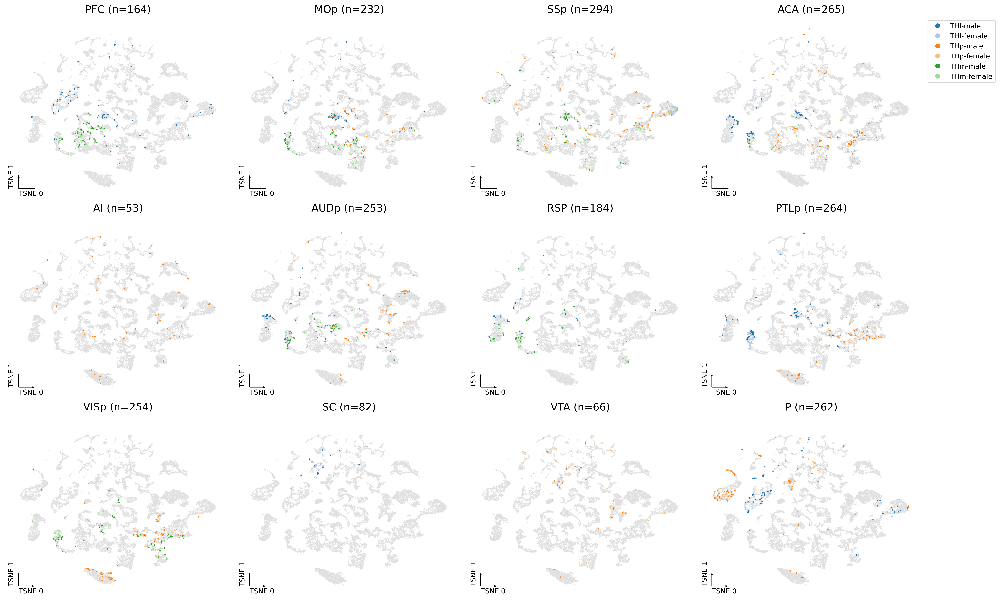

In [17]:
ncol = 4
nrow = (len(target_list) - 1) // ncol + 1
coord_base = "tsne"
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 5, nrow * 4), dpi=300, constrained_layout=True)

for xx, ax in zip(target_list, axes.flatten()):
    tmp = adata_merge.obs.loc[adata_merge.obs["Target"] == xx].copy()
    ax.scatter(
        adata_merge.obs[f"{coord_base}_0"],
        adata_merge.obs[f"{coord_base}_1"],
        c="#e0e0e0",
        edgecolors="none",
        s=ds,
        rasterized=True,
    )
    _ = categorical_scatter(
        data=tmp,
        ax=ax,
        coord_base=coord_base,
        s=ds * 20,
        hue=tmp[["Source", "Gender"]].apply("-".join, axis=1),
        # text_anno='leiden',
        palette=target_palette,
        labelsize=10,
        max_points=None,
        scatter_kws={"rasterized": True},
        show_legend=False,
    )
    ax.set_title(f"{xx} (n={tmp.shape[0]})", fontsize=15)

markers = [
    plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
    for color in target_palette.values()
]

if len(target_list)<=ncol:
    ax = axes[len(target_list)-1]
else:
    ax = axes[0, -1]
ax.legend(
    markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
)

for ax in axes.flatten()[len(target_list) :]:
    ax.axis("off")

plt.savefig(f'plot/{t}_EpiRetroTarget_tsne.pdf', transparent=True)


In [14]:
tarmap = {'Motor':'MOp', 
          'Visual':'VISp', 
          'Prefrontal':'PFC', 
          'Auditory':'AUDp', 
          'Somatosensory':'SSp'
         }
retro.obs['Target'] = retro.obs['Projection'].map(tarmap)
retro.obs['Target'].value_counts()

MOp     484
VISp    435
PFC     388
AUDp    380
SSp     285
Name: Target, dtype: int64

In [15]:
target_palette = {xx:yy for xx,yy in zip(target_list, sns.color_palette('tab20', len(target_list)))}


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


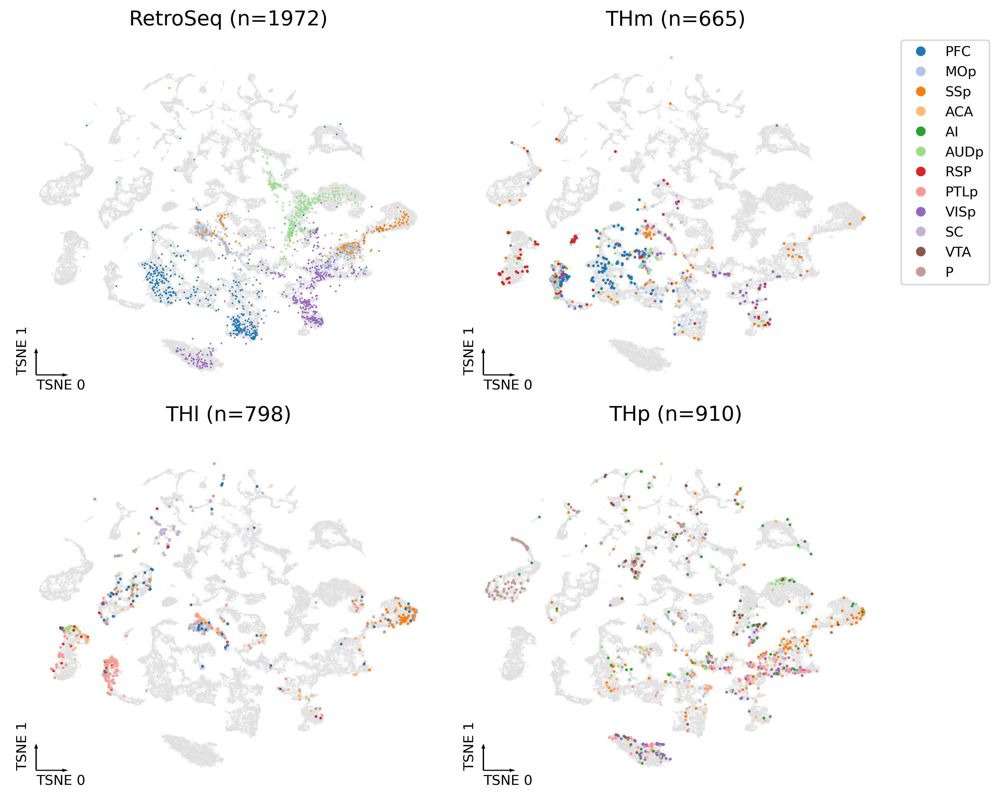

In [78]:
coord_base = "tsne"
fig, axes = plt.subplots(2, 2, figsize=(10, 8), dpi=300, constrained_layout=True)

ax = axes[0, 0]
ax.scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    rasterized=True,
)
_ = categorical_scatter(
    data=retro.obs,
    ax=ax,
    coord_base=coord_base,
    s=ds * 8,
    hue='Target',
    # text_anno='Target',
    palette=target_palette,
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
    show_legend=False,
)
ax.set_title(f"RetroSeq (n={retro.shape[0]})", fontsize=15)

for i,xx in enumerate(['THm', 'THl', 'THp']):
    ax = axes.flatten()[i+1]
    tmp = adata_merge.obs.loc[adata_merge.obs["Source"] == xx].copy()
    ax.scatter(
        adata_merge.obs[f"{coord_base}_0"],
        adata_merge.obs[f"{coord_base}_1"],
        c="#e0e0e0",
        edgecolors="none",
        s=ds,
        rasterized=True,
    )
    _ = categorical_scatter(
        data=tmp,
        ax=ax,
        coord_base=coord_base,
        s=ds * 20,
        hue='Target',
        # text_anno='Target',
        palette=target_palette,
        labelsize=10,
        max_points=None,
        scatter_kws={"rasterized": True},
        show_legend=False,
    )
    
    ax.set_title(f"{xx} (n={tmp.shape[0]})", fontsize=15)
    
markers = [
    plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
    for color in target_palette.values()
]

ax = axes[0, -1]
ax.legend(
    markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
)

plt.savefig(f'plot/{t}_RetroTarget_tsne.pdf', transparent=True)


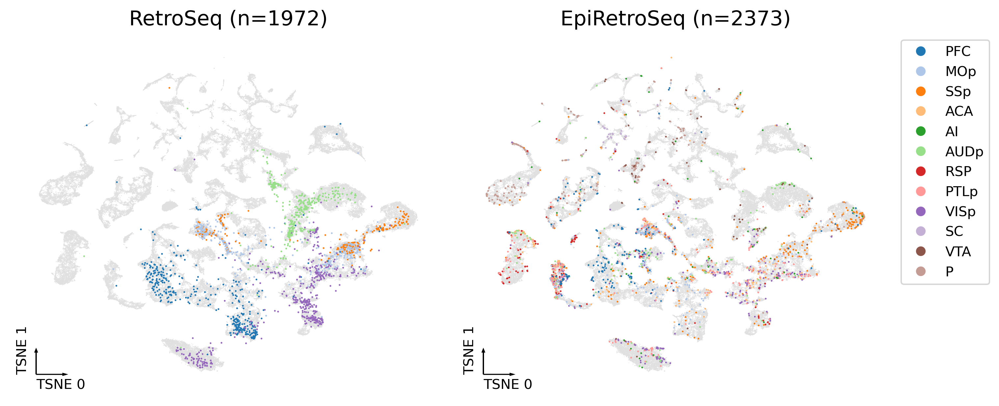

In [79]:
coord_base = "tsne"
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=300, constrained_layout=True)

ax = axes[0]
ax.scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    rasterized=True,
)
_ = categorical_scatter(
    data=retro.obs,
    ax=ax,
    coord_base=coord_base,
    s=ds * 8,
    hue='Target',
    # text_anno='Target',
    palette=target_palette,
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
    show_legend=False,
)
ax.set_title(f"RetroSeq (n={retro.shape[0]})", fontsize=15)

ax = axes[1]
tmp = adata_merge.obs.loc[adata_merge.obs["Target"]!='?'].copy()
ax.scatter(
    adata_merge.obs[f"{coord_base}_0"],
    adata_merge.obs[f"{coord_base}_1"],
    c="#e0e0e0",
    edgecolors="none",
    s=ds,
    rasterized=True,
)
_ = categorical_scatter(
    data=tmp,
    ax=ax,
    coord_base=coord_base,
    s=ds * 8,
    hue='Target',
    # text_anno='Target',
    palette=target_palette,
    labelsize=10,
    max_points=None,
    scatter_kws={"rasterized": True},
    show_legend=False,
)

ax.set_title(f"EpiRetroSeq (n={tmp.shape[0]})", fontsize=15)
    
markers = [
    plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
    for color in target_palette.values()
]

ax = axes[-1]
ax.legend(
    markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
)

plt.savefig(f'plot/{t}merged_RetroTarget_tsne.pdf', transparent=True)


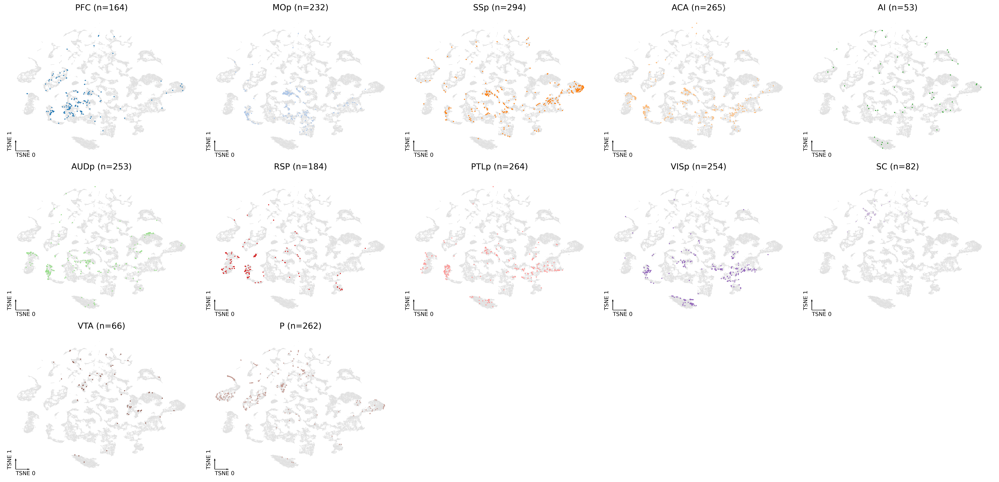

In [80]:
ncol = 5
nrow = (len(target_list) - 1) // ncol + 1
coord_base = "tsne"
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 5, nrow * 4), dpi=300, constrained_layout=True)

for xx, ax in zip(target_list, axes.flatten()):
    tmp = adata_merge.obs.loc[adata_merge.obs["Target"] == xx].copy()
    ax.scatter(
        adata_merge.obs[f"{coord_base}_0"],
        adata_merge.obs[f"{coord_base}_1"],
        c="#e0e0e0",
        edgecolors="none",
        s=ds,
        rasterized=True,
    )
    _ = categorical_scatter(
        data=tmp,
        ax=ax,
        coord_base=coord_base,
        s=ds * 20,
        hue='Target',
        # text_anno='leiden',
        palette=target_palette,
        labelsize=10,
        max_points=None,
        scatter_kws={"rasterized": True},
        show_legend=False,
    )
    ax.set_title(f"{xx} (n={tmp.shape[0]})", fontsize=15)

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list) :]:
    ax.axis("off")

plt.savefig(f'plot/{t}_EpiRetroTarget_tsne.pdf', transparent=True)


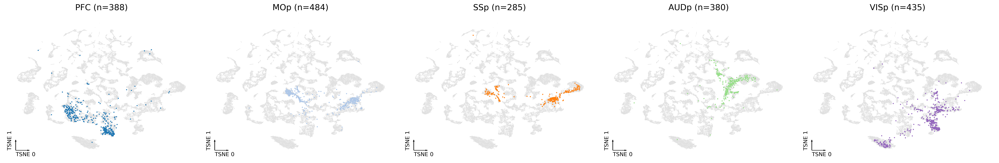

In [81]:
ncol = 5
nrow = (len(tarmap) - 1) // ncol + 1
coord_base = "tsne"
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 5, nrow * 4), dpi=300, constrained_layout=True)

for xx, ax in zip([xx for xx in target_list if xx in tarmap.values()], axes.flatten()):
    tmp = retro.obs.loc[retro.obs["Target"] == xx].copy()
    ax.scatter(
        adata_merge.obs[f"{coord_base}_0"],
        adata_merge.obs[f"{coord_base}_1"],
        c="#e0e0e0",
        edgecolors="none",
        s=ds,
        rasterized=True,
    )
    _ = categorical_scatter(
        data=tmp,
        ax=ax,
        coord_base=coord_base,
        s=ds * 20,
        hue='Target',
        # text_anno='leiden',
        palette=target_palette,
        labelsize=10,
        max_points=None,
        scatter_kws={"rasterized": True},
        show_legend=False,
    )
    ax.set_title(f"{xx} (n={tmp.shape[0]})", fontsize=15)

for ax in axes.flatten()[len(target_list) :]:
    ax.axis("off")

plt.savefig(f'plot/{t}_RetroTarget_tsne.pdf', transparent=True)


In [19]:
tmp1 = adata_merge.obs.loc[adata_merge.obs['Target']!='?']
tmp1['Target'] = 'Epi-' + tmp1['Target']
tmp2 = retro.obs.loc[retro.obs['Target']!='?']
tmp2['Target'] = 'Retro-' + tmp2['Target'].astype(str)
count = pd.concat([tmp1, tmp2], axis=0)[['Target', 'leiden']].value_counts().unstack(fill_value=0)
count = count / count.sum(axis=1)[:, None]
count_epi = count.loc[count.index.str.split('-').str[0]=='Epi']
count_epi.index = count_epi.index.str.split('-').str[1]
count_retro = count.loc[count.index.str.split('-').str[0]=='Retro']
count_retro.index = count_retro.index.str.split('-').str[1]
# count_epi = adata_merge.obs.loc[adata_merge.obs['Target']!='?', ['Target', 'leiden']].value_counts().unstack(fill_value=0)
# count_epi = count_epi / count_epi.sum(axis=1)[:, None]
# count_retro = retro.obs.loc[retro.obs['Target']!='?', ['Target', 'leiden']].value_counts().unstack(fill_value=0)
# count_retro = count_retro / count_retro.sum(axis=1)[:, None]


In [82]:
dist = pd.DataFrame([[pd.concat([count_epi.loc[xx], count_retro.loc[yy]], axis=1).fillna(0).min(axis=1).sum() for xx in count_epi.index] for yy in count_retro.index], 
                    columns=count_epi.index, 
                    index=count_retro.index, 
                 )
dist

Target,ACA,AI,AUDp,MOp,P,PFC,PTLp,RSP,SC,SSp,VISp,VTA
Target,,,,,,,,,,,,
AUDp,0.105114,0.191708,0.314864,0.058394,0.051587,0.041142,0.142823,0.029462,0.007895,0.137343,0.144613,0.359569
MOp,0.374271,0.189654,0.126213,0.521765,0.068844,0.144880,0.325758,0.072179,0.000000,0.377228,0.238612,0.057851
PFC,0.203044,0.164754,0.165651,0.227915,0.039801,0.375974,0.079272,0.059222,0.005155,0.229557,0.097147,0.053499
SSp,0.208408,0.136445,0.070259,0.341742,0.110071,0.141164,0.162480,0.052422,0.000000,0.511028,0.090206,0.037321
VISp,0.288788,0.380438,0.216664,0.085920,0.066491,0.051177,0.448537,0.072114,0.000000,0.160333,0.613911,0.176907


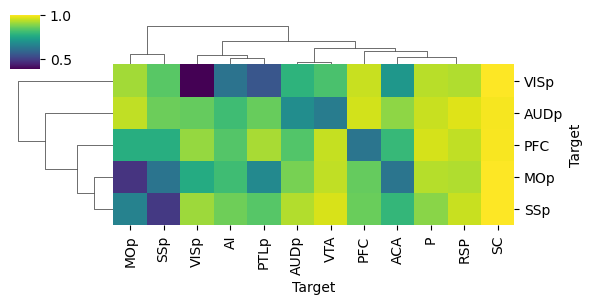

In [83]:
cg = sns.clustermap(1 - dist, cmap='viridis', metric='cosine', figsize=(6,3))
rorder = cg.dendrogram_row.reordered_ind.copy()
corder = cg.dendrogram_col.reordered_ind.copy()
dist = dist.iloc[rorder, corder]
xidx = pd.Series(dist.index).reset_index().set_index('Target')['index']
yidx = pd.Series(dist.columns).reset_index().set_index('Target')['index']

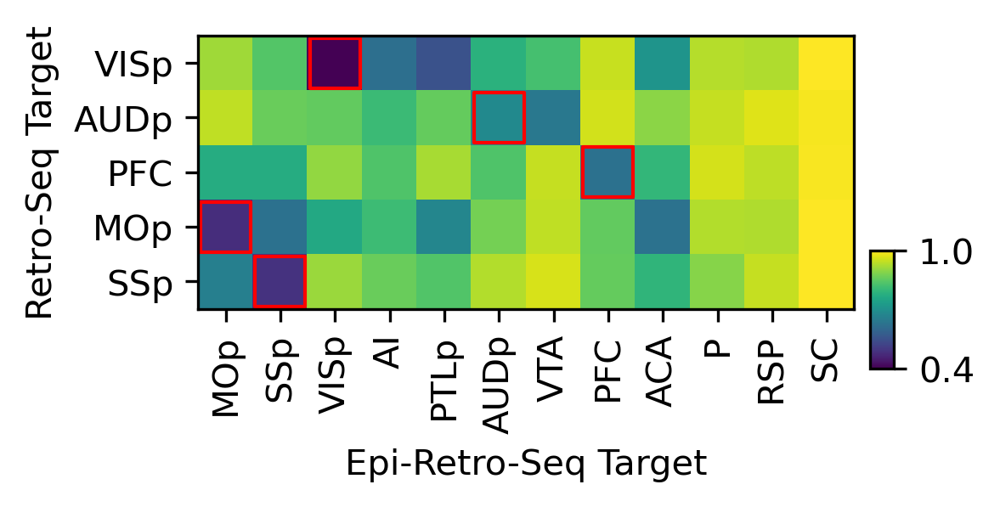

In [84]:
fig, ax = plt.subplots(figsize=(4,2),dpi=300)
plot = ax.imshow(1-dist, cmap='viridis', vmin=0.4, vmax=1)
cbar = plt.colorbar(plot, ax=ax, shrink=0.3, aspect=5, pad=0.02, anchor=(0, 0))
cbar.set_ticks([cbar.vmin, cbar.vmax])
ax.set_xticks(np.arange(dist.shape[1]))
ax.set_yticks(np.arange(dist.shape[0]))
ax.set_xticklabels(dist.columns, rotation=90)
ax.set_yticklabels(dist.index)
ax.set_xlabel('Epi-Retro-Seq Target', fontsize=10)
ax.set_ylabel('Retro-Seq Target', fontsize=10)
ax.scatter(yidx.loc[tarmap.values()], xidx.loc[tarmap.values()], facecolor='none', marker='s', s=200, edgecolor='r')
plt.savefig(f'plot/{t}_EpiRetroSeqRetroSeq_Target_os.pdf', transparent=True, dpi=300)


In [85]:
from sklearn.metrics import pairwise_distances

dist = pairwise_distances(count_epi, count_retro, metric='cosine')
dist = pd.DataFrame(dist, index=count_epi.index, columns=count_retro.index).T

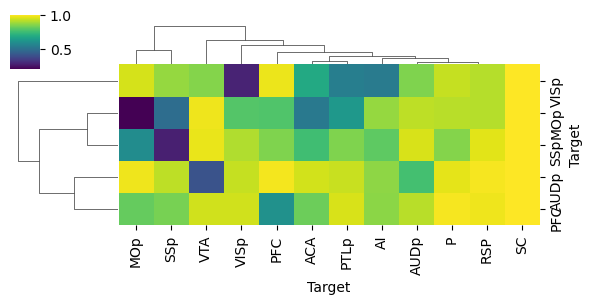

In [86]:
cg = sns.clustermap(dist, cmap='viridis', metric='cosine', figsize=(6,3))
rorder = cg.dendrogram_row.reordered_ind.copy()
corder = cg.dendrogram_col.reordered_ind.copy()
dist = dist.iloc[rorder, corder]
xidx = pd.Series(dist.index).reset_index().set_index('Target')['index']
yidx = pd.Series(dist.columns).reset_index().set_index('Target')['index']


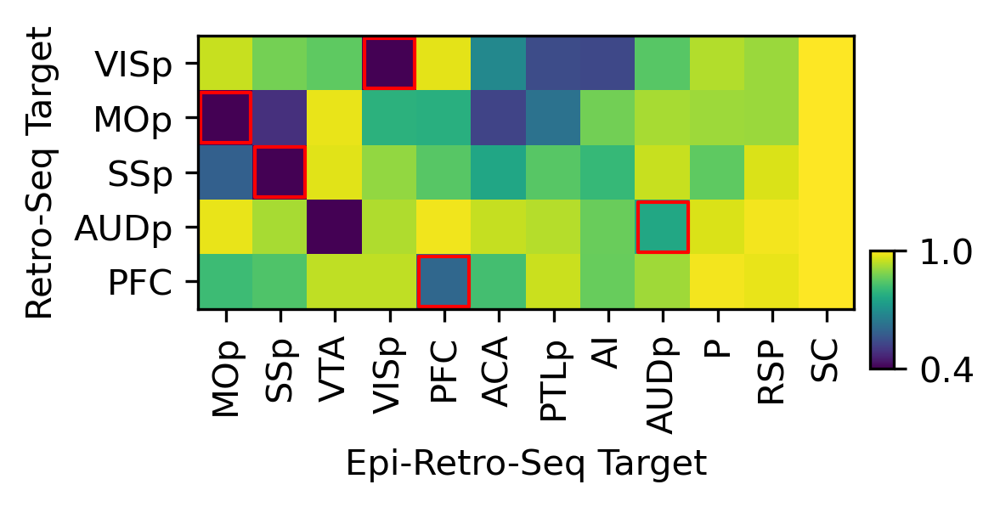

In [87]:
fig, ax = plt.subplots(figsize=(4,2),dpi=300)
plot = ax.imshow(dist, cmap='viridis', vmin=0.4, vmax=1)
cbar = plt.colorbar(plot, ax=ax, shrink=0.3, aspect=5, pad=0.02, anchor=(0, 0))
cbar.set_ticks([cbar.vmin, cbar.vmax])
ax.set_xticks(np.arange(dist.shape[1]))
ax.set_yticks(np.arange(dist.shape[0]))
ax.set_xticklabels(dist.columns, rotation=90)
ax.set_yticklabels(dist.index)
ax.set_xlabel('Epi-Retro-Seq Target', fontsize=10)
ax.set_ylabel('Retro-Seq Target', fontsize=10)
ax.scatter(yidx.loc[tarmap.values()], xidx.loc[tarmap.values()], facecolor='none', marker='s', s=200, edgecolor='r')
plt.savefig(f'plot/{t}_EpiRetroSeqRetroSeq_Target_cosine.pdf', transparent=True, dpi=300)
